In [30]:
# Amruta Borse
# BATCH - PGA-04

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
import keras
import os
import cv2
from keras.models import Sequential
from keras.layers import Conv2D , MaxPool2D ,Flatten , Dense, Dropout
from keras.utils import to_categorical
from keras.layers import Convolution2D , MaxPooling2D , Dense , Dropout , Flatten
from PIL import Image

# Assigning path

In [2]:
train_path = r"C:\new python\DL_CAPSTONE\train"

# Creating categories

In [3]:
category = ['non_smile' , 'smile'] ## so index for this is 0,1

# Create Training Data

In [4]:
image_size =200         # Resizing images into 200 X 200

train_images = []        # empty list to append our images into numeric array format.
                    
train_images = []
for i in category:
    folder = os.path.join(train_path ,i)     # joining train folder and individual category folder path 
    label = category.index(i)            # assigining label to each folder
    for image in os.listdir(folder):    # Itreating through all images in the path "folder"
        image_path = os.path.join(folder , image)     # joining folder and image path  
        image_array = cv2.imread(image_path)   # cv2. imread() method loads an image from the specified path
        image_array =cv2.resize(image_array , (image_size , image_size) )        # Resizing images into 200 X 200
        train_images.append([image_array , label])

In [5]:
train_images                             #iterating each category one by one

[[array([[[ 95, 127, 170],
          [ 95, 127, 170],
          [100, 132, 175],
          ...,
          [ 51,  79, 120],
          [ 51,  79, 120],
          [ 51,  79, 120]],
  
         [[ 95, 127, 170],
          [ 95, 127, 170],
          [100, 132, 175],
          ...,
          [ 51,  79, 120],
          [ 51,  79, 120],
          [ 51,  79, 120]],
  
         [[ 96, 128, 171],
          [ 96, 128, 171],
          [101, 133, 176],
          ...,
          [ 52,  80, 121],
          [ 52,  80, 121],
          [ 52,  80, 121]],
  
         ...,
  
         [[121, 140, 185],
          [121, 140, 185],
          [120, 139, 184],
          ...,
          [ 64,  63,  65],
          [ 64,  63,  65],
          [ 64,  63,  65]],
  
         [[122, 141, 186],
          [122, 141, 186],
          [121, 140, 185],
          ...,
          [ 64,  63,  65],
          [ 64,  63,  65],
          [ 64,  63,  65]],
  
         [[122, 141, 186],
          [122, 141, 186],
          [121, 140, 185

In [6]:
len(train_images)                          #total train images

1203

# Shuffle the Dataset

In [7]:
np.random.shuffle(train_images)      #for shuffling numberwise/batchwise 10,25(ascending)

# Assigning Labels and Features

In [8]:
X = []               #no of train imgs
Y = []               #labels

for X_values , labels in train_images:
    X.append(X_values)
    Y.append(labels)

X = np.array(X)
Y = np.array(Y)

In [9]:
X                           #append each image(without 0 & 1)

array([[[[ 76, 101, 111],
         [ 76, 101, 111],
         [ 75, 100, 111],
         ...,
         [111, 151, 193],
         [110, 150, 192],
         [110, 150, 192]],

        [[ 76, 101, 111],
         [ 76, 101, 111],
         [ 75, 100, 111],
         ...,
         [111, 151, 193],
         [110, 150, 192],
         [110, 150, 192]],

        [[ 75, 100, 110],
         [ 75, 100, 110],
         [ 74,  99, 110],
         ...,
         [110, 150, 193],
         [110, 150, 192],
         [110, 150, 192]],

        ...,

        [[122, 158, 168],
         [122, 158, 168],
         [120, 157, 166],
         ...,
         [ 76, 109, 135],
         [ 75, 108, 134],
         [ 75, 108, 134]],

        [[122, 158, 168],
         [122, 158, 168],
         [121, 157, 166],
         ...,
         [ 75, 108, 134],
         [ 74, 107, 133],
         [ 74, 107, 133]],

        [[122, 158, 168],
         [122, 158, 168],
         [121, 157, 166],
         ...,
         [ 75, 108, 134],
        

In [10]:
Y                     

array([0, 0, 1, ..., 1, 0, 1])

In [11]:
print(X.shape)                 #(numbers,dimension,rgb color)
print(Y.shape)

(1203, 200, 200, 3)
(1203,)


# Checking sample images

1


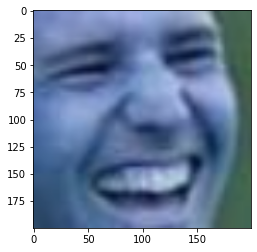

In [12]:
x=2                                   #(0 & 1 showing labels)
plt.imshow(X[x])
print(Y[x])

0


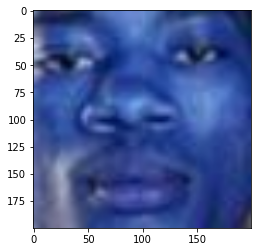

In [13]:
x=5                                 
plt.imshow(X[x])
print(Y[x])

# Normalising X 

In [14]:
X=X/255                    #range of rgb 0 to 255 that changes range of pixel intensity values

# Split X and Y for use in CNN

In [15]:
from sklearn.model_selection import train_test_split
X_test,X_train,y_test , y_train = train_test_split(X,Y , train_size=0.2 )

In [16]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(963, 200, 200, 3)
(240, 200, 200, 3)
(963,)
(240,)


# Define, compile and train the CNN Model

In [17]:
batch_size = 16
nb_classes =4
nb_epochs = 10
img_rows, img_columns = 200, 200
img_channel = 3
nb_filters = 32
nb_pool = 2
nb_conv = 3

In [18]:
model = tf.keras.Sequential([
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu,
                           input_shape=(200, 200, 3)),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Conv2D(32, (3,3), padding='same', activation=tf.nn.relu),
    tf.keras.layers.MaxPooling2D((2, 2), strides=2),
    tf.keras.layers.Dropout(0.5),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(128, activation=tf.nn.relu),
    tf.keras.layers.Dense(4,  activation=tf.nn.softmax)
])
model.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])
model1 = model.fit(X_train, y_train, batch_size = batch_size, epochs = nb_epochs, verbose = 1, validation_data = (X_test, y_test))

Epoch 1/10
61/61 [==============================] - 40s 620ms/step - loss: 1.0903 - accuracy: 0.5119 - val_loss: 0.6724 - val_accuracy: 0.4917
Epoch 2/10
61/61 [==============================] - 35s 581ms/step - loss: 0.6449 - accuracy: 0.6220 - val_loss: 0.5462 - val_accuracy: 0.8083
Epoch 3/10
61/61 [==============================] - 36s 588ms/step - loss: 0.5240 - accuracy: 0.7435 - val_loss: 0.5293 - val_accuracy: 0.7083
Epoch 4/10
61/61 [==============================] - 37s 599ms/step - loss: 0.5213 - accuracy: 0.7529 - val_loss: 0.3637 - val_accuracy: 0.8500
Epoch 5/10
61/61 [==============================] - 37s 614ms/step - loss: 0.3710 - accuracy: 0.8453 - val_loss: 0.2839 - val_accuracy: 0.8833
Epoch 6/10
61/61 [==============================] - 35s 580ms/step - loss: 0.3158 - accuracy: 0.8650 - val_loss: 0.3000 - val_accuracy: 0.8667
Epoch 7/10
61/61 [==============================] - 35s 578ms/step - loss: 0.3320 - accuracy: 0.8629 - val_loss: 0.2758 - val_accuracy: 0.8792

# Accuracy and Score of model

In [19]:
score = model.evaluate(X_test, y_test, verbose = 0 )
print("Test Score: ", score[0])
print("Test accuracy: ", score[1])

Test Score:  0.5153557062149048
Test accuracy:  0.7583333253860474


# loading the test data

In [20]:
image_size = 200 
test_path = r"C:\new python\DL_CAPSTONE\test"
test_images = []
for img in os.listdir(test_path):
    image_path_2 = os.path.join(test_path , img)
    image_array_2 = cv2.imread(image_path_2)
    image_array_2 =cv2.resize(image_array_2 , (image_size , image_size) )
    test_images.append(image_array_2)

In [21]:
len(test_images)

12119

In [22]:
test_images

[array([[[ 36,  47,  74],
         [ 36,  47,  74],
         [ 36,  47,  74],
         ...,
         [142, 165, 203],
         [142, 165, 203],
         [142, 165, 203]],
 
        [[ 36,  47,  74],
         [ 36,  47,  74],
         [ 36,  47,  74],
         ...,
         [142, 165, 203],
         [142, 165, 203],
         [142, 165, 203]],
 
        [[ 36,  47,  75],
         [ 36,  47,  75],
         [ 37,  48,  75],
         ...,
         [142, 165, 203],
         [142, 165, 203],
         [142, 165, 203]],
 
        ...,
 
        [[ 49,  76, 110],
         [ 49,  76, 110],
         [ 51,  79, 112],
         ...,
         [ 97,  70,  70],
         [101,  72,  71],
         [101,  72,  71]],
 
        [[ 49,  76, 110],
         [ 49,  76, 110],
         [ 51,  78, 112],
         ...,
         [ 96,  67,  68],
         [100,  70,  69],
         [100,  70,  69]],
 
        [[ 49,  76, 110],
         [ 49,  76, 110],
         [ 51,  78, 112],
         ...,
         [ 96,  67,  68],
  

In [23]:
Test_X=[]
for X_val in test_images:
    print(X_val)
    Test_X.append(X_val)
Test_X=np.array(Test_X)

[[[ 36  47  74]
  [ 36  47  74]
  [ 36  47  74]
  ...
  [142 165 203]
  [142 165 203]
  [142 165 203]]

 [[ 36  47  74]
  [ 36  47  74]
  [ 36  47  74]
  ...
  [142 165 203]
  [142 165 203]
  [142 165 203]]

 [[ 36  47  75]
  [ 36  47  75]
  [ 37  48  75]
  ...
  [142 165 203]
  [142 165 203]
  [142 165 203]]

 ...

 [[ 49  76 110]
  [ 49  76 110]
  [ 51  79 112]
  ...
  [ 97  70  70]
  [101  72  71]
  [101  72  71]]

 [[ 49  76 110]
  [ 49  76 110]
  [ 51  78 112]
  ...
  [ 96  67  68]
  [100  70  69]
  [100  70  69]]

 [[ 49  76 110]
  [ 49  76 110]
  [ 51  78 112]
  ...
  [ 96  67  68]
  [100  70  69]
  [100  70  69]]]
[[[ 47  84 110]
  [ 47  84 110]
  [ 54  91 117]
  ...
  [ 91 145 179]
  [ 88 142 177]
  [ 88 142 177]]

 [[ 47  84 110]
  [ 47  84 110]
  [ 54  91 117]
  ...
  [ 91 145 179]
  [ 88 142 177]
  [ 88 142 177]]

 [[ 48  85 111]
  [ 48  85 111]
  [ 54  92 118]
  ...
  [ 91 145 178]
  [ 88 142 176]
  [ 88 142 176]]

 ...

 [[185 194 194]
  [185 194 194]
  [189 197 197]
  ..

  [ 46  84 142]]]
[[[ 12  15  46]
  [ 12  15  46]
  [  8  10  41]
  ...
  [ 16  42 100]
  [ 14  41  98]
  [ 14  41  98]]

 [[ 12  15  46]
  [ 12  15  46]
  [  8  10  41]
  ...
  [ 16  42 100]
  [ 14  41  98]
  [ 14  41  98]]

 [[ 14  17  48]
  [ 14  17  48]
  [ 10  12  43]
  ...
  [ 14  41  98]
  [ 12  38  95]
  [ 12  38  95]]

 ...

 [[  5   0  20]
  [  5   0  20]
  [  4   0  20]
  ...
  [ 76 109 182]
  [ 76 109 182]
  [ 76 109 182]]

 [[  5   0  21]
  [  5   0  21]
  [  4   0  20]
  ...
  [ 77 110 183]
  [ 77 110 183]
  [ 77 110 183]]

 [[  5   0  21]
  [  5   0  21]
  [  4   0  20]
  ...
  [ 77 110 183]
  [ 77 110 183]
  [ 77 110 183]]]
[[[ 60  62  56]
  [ 60  62  56]
  [ 57  59  53]
  ...
  [ 78 106 136]
  [ 74 102 132]
  [ 74 102 132]]

 [[ 60  62  56]
  [ 60  62  56]
  [ 57  59  53]
  ...
  [ 78 106 136]
  [ 74 102 132]
  [ 74 102 132]]

 [[ 59  61  55]
  [ 59  61  55]
  [ 56  58  53]
  ...
  [ 81 109 139]
  [ 78 105 135]
  [ 78 105 135]]

 ...

 [[ 18  22  27]
  [ 18  22  27]
  

  [ 54  39  23]]]
[[[134 107 133]
  [134 107 133]
  [123  97 124]
  ...
  [148 166 207]
  [146 164 205]
  [146 164 205]]

 [[134 107 133]
  [134 107 133]
  [123  97 124]
  ...
  [148 166 207]
  [146 164 205]
  [146 164 205]]

 [[135 108 134]
  [135 108 134]
  [125  99 126]
  ...
  [147 165 206]
  [145 163 204]
  [145 163 204]]

 ...

 [[131 101 107]
  [131 101 107]
  [131 100 107]
  ...
  [ 77  90 142]
  [ 77  90 142]
  [ 77  90 142]]

 [[131 100 107]
  [131 100 107]
  [131  99 107]
  ...
  [ 76  89 141]
  [ 76  89 141]
  [ 76  89 141]]

 [[131 100 107]
  [131 100 107]
  [131 100 107]
  ...
  [ 76  89 141]
  [ 76  89 141]
  [ 76  89 141]]]
[[[ 67  85 102]
  [ 67  85 102]
  [ 68  86 103]
  ...
  [ 83  94 122]
  [ 80  91 119]
  [ 80  91 119]]

 [[ 67  85 102]
  [ 67  85 102]
  [ 68  86 103]
  ...
  [ 83  94 122]
  [ 80  91 119]
  [ 80  91 119]]

 [[ 68  86 102]
  [ 68  86 102]
  [ 69  87 104]
  ...
  [ 84  95 123]
  [ 81  92 120]
  [ 81  92 120]]

 ...

 [[ 36  46  46]
  [ 36  46  46]
  

[[[119 150 159]
  [119 150 159]
  [128 159 168]
  ...
  [124 152 163]
  [121 149 160]
  [121 149 160]]

 [[119 150 159]
  [119 150 159]
  [128 159 168]
  ...
  [124 152 163]
  [121 149 160]
  [121 149 160]]

 [[120 151 160]
  [120 151 160]
  [129 160 169]
  ...
  [124 152 163]
  [121 149 160]
  [121 149 160]]

 ...

 [[ 68  95 121]
  [ 68  95 121]
  [ 66  93 119]
  ...
  [ 74 104 125]
  [ 76 106 126]
  [ 76 106 126]]

 [[ 67  94 120]
  [ 67  94 120]
  [ 65  92 118]
  ...
  [ 74 103 124]
  [ 76 105 126]
  [ 76 105 126]]

 [[ 67  94 120]
  [ 67  94 120]
  [ 65  92 118]
  ...
  [ 74 103 124]
  [ 76 105 126]
  [ 76 105 126]]]
[[[ 61 108 135]
  [ 61 108 135]
  [ 67 114 141]
  ...
  [ 38  66 101]
  [ 34  62  96]
  [ 34  62  96]]

 [[ 61 108 135]
  [ 61 108 135]
  [ 67 114 141]
  ...
  [ 38  66 101]
  [ 34  62  96]
  [ 34  62  96]]

 [[ 64 111 138]
  [ 64 111 138]
  [ 70 117 144]
  ...
  [ 36  64  99]
  [ 32  59  93]
  [ 32  59  93]]

 ...

 [[ 20  37  76]
  [ 20  37  76]
  [ 19  36  75]
  ..

  [ 28  42  60]]]
[[[22 45 91]
  [22 45 91]
  [23 46 91]
  ...
  [15 34 67]
  [15 34 67]
  [15 34 67]]

 [[22 45 91]
  [22 45 91]
  [23 46 92]
  ...
  [15 34 67]
  [15 34 67]
  [15 34 67]]

 [[22 44 90]
  [22 44 90]
  [23 45 91]
  ...
  [16 34 67]
  [16 34 67]
  [16 34 67]]

 ...

 [[37 49 74]
  [37 49 74]
  [37 49 74]
  ...
  [42 47 68]
  [49 54 75]
  [49 54 75]]

 [[37 49 73]
  [37 49 73]
  [37 49 73]
  ...
  [42 47 68]
  [49 54 75]
  [49 54 75]]

 [[37 49 73]
  [37 49 73]
  [37 49 73]
  ...
  [42 47 68]
  [49 54 75]
  [49 54 75]]]
[[[ 19  33  56]
  [ 19  33  56]
  [ 22  36  58]
  ...
  [ 91 143 184]
  [ 90 142 183]
  [ 90 142 183]]

 [[ 19  33  56]
  [ 19  33  56]
  [ 22  35  59]
  ...
  [ 91 143 184]
  [ 90 142 183]
  [ 90 142 183]]

 [[ 19  33  56]
  [ 19  33  56]
  [ 21  35  58]
  ...
  [ 89 141 182]
  [ 88 140 181]
  [ 88 140 181]]

 ...

 [[ 84  92  92]
  [ 84  92  92]
  [ 84  92  92]
  ...
  [107 143 161]
  [107 143 161]
  [107 143 161]]

 [[ 84  92  92]
  [ 84  92  92]
  [ 84

  [ 39  41  51]]]
[[[102 127 159]
  [102 127 159]
  [102 127 159]
  ...
  [144 171 198]
  [146 173 200]
  [146 173 200]]

 [[102 127 159]
  [102 127 159]
  [103 128 159]
  ...
  [144 171 198]
  [146 173 200]
  [146 173 200]]

 [[101 126 158]
  [101 126 158]
  [102 127 159]
  ...
  [143 170 197]
  [145 172 199]
  [145 172 199]]

 ...

 [[ 19  19  13]
  [ 19  19  13]
  [ 16  17  11]
  ...
  [ 79  65  59]
  [ 80  66  60]
  [ 80  66  60]]

 [[ 21  21  15]
  [ 21  21  15]
  [ 18  18  12]
  ...
  [ 80  66  60]
  [ 81  67  61]
  [ 81  67  61]]

 [[ 21  21  15]
  [ 21  21  15]
  [ 18  18  12]
  ...
  [ 80  66  60]
  [ 81  67  61]
  [ 81  67  61]]]
[[[ 86  97 141]
  [ 86  97 141]
  [ 89 100 145]
  ...
  [127 137 197]
  [127 137 197]
  [127 137 197]]

 [[ 86  97 141]
  [ 86  97 141]
  [ 90 100 145]
  ...
  [127 137 197]
  [127 137 197]
  [127 137 197]]

 [[ 86  97 141]
  [ 86  97 141]
  [ 89 100 145]
  ...
  [127 137 197]
  [127 137 197]
  [127 137 197]]

 ...

 [[157 131 130]
  [157 131 130]
  

  [ 67  94 185]]]
[[[ 72 102 137]
  [ 72 102 137]
  [ 68  98 133]
  ...
  [ 79 105 141]
  [ 84 110 146]
  [ 84 110 146]]

 [[ 72 102 137]
  [ 72 102 137]
  [ 68  98 133]
  ...
  [ 79 105 141]
  [ 84 110 146]
  [ 84 110 146]]

 [[ 71 100 136]
  [ 71 100 136]
  [ 66  97 132]
  ...
  [ 78 104 141]
  [ 83 109 145]
  [ 83 109 145]]

 ...

 [[  1   5   0]
  [  1   5   0]
  [  1   5   0]
  ...
  [  6   4   4]
  [  6   4   3]
  [  6   4   3]]

 [[  0   5   0]
  [  0   5   0]
  [  0   5   0]
  ...
  [  6   5   4]
  [  6   4   3]
  [  6   4   3]]

 [[  0   5   0]
  [  0   5   0]
  [  0   5   0]
  ...
  [  6   5   4]
  [  6   4   3]
  [  6   4   3]]]
[[[ 43  68 118]
  [ 43  68 118]
  [ 42  67 117]
  ...
  [ 26  50 122]
  [ 28  52 124]
  [ 28  52 124]]

 [[ 43  68 118]
  [ 43  68 118]
  [ 42  67 117]
  ...
  [ 26  50 122]
  [ 28  52 124]
  [ 28  52 124]]

 [[ 40  66 115]
  [ 40  66 115]
  [ 40  65 115]
  ...
  [ 24  49 119]
  [ 25  50 121]
  [ 25  50 121]]

 ...

 [[ 14  38  80]
  [ 14  38  80]
  

[[[  7  56  88]
  [  7  56  88]
  [  8  57  89]
  ...
  [105 119 147]
  [102 116 144]
  [102 116 144]]

 [[  7  56  88]
  [  7  56  88]
  [  8  57  89]
  ...
  [105 119 147]
  [102 116 144]
  [102 116 144]]

 [[  7  56  88]
  [  7  56  88]
  [  8  57  89]
  ...
  [103 117 145]
  [100 114 142]
  [100 114 142]]

 ...

 [[ 96 144 172]
  [ 96 144 172]
  [ 89 137 165]
  ...
  [ 74 107 157]
  [ 74 107 157]
  [ 74 107 157]]

 [[ 97 145 173]
  [ 97 145 173]
  [ 89 137 165]
  ...
  [ 74 107 157]
  [ 74 107 157]
  [ 74 107 157]]

 [[ 97 145 173]
  [ 97 145 173]
  [ 89 137 165]
  ...
  [ 74 107 157]
  [ 74 107 157]
  [ 74 107 157]]]
[[[ 61  93 128]
  [ 61  93 128]
  [ 63  95 130]
  ...
  [147 164 187]
  [148 164 187]
  [148 164 187]]

 [[ 61  93 128]
  [ 61  93 128]
  [ 63  95 130]
  ...
  [147 164 187]
  [148 164 187]
  [148 164 187]]

 [[ 60  92 127]
  [ 60  92 127]
  [ 62  94 129]
  ...
  [146 163 186]
  [147 163 186]
  [147 163 186]]

 ...

 [[ 65  90 116]
  [ 65  90 116]
  [ 73  98 124]
  ..

[[[122 156 150]
  [122 156 150]
  [119 153 147]
  ...
  [ 56  78  83]
  [ 57  79  84]
  [ 57  79  84]]

 [[122 156 150]
  [122 156 150]
  [119 153 147]
  ...
  [ 56  78  83]
  [ 57  79  84]
  [ 57  79  84]]

 [[123 157 151]
  [123 157 151]
  [121 154 149]
  ...
  [ 57  79  84]
  [ 57  79  84]
  [ 57  79  84]]

 ...

 [[ 69 105 128]
  [ 69 105 128]
  [ 72 109 132]
  ...
  [ 39  46  61]
  [ 39  46  61]
  [ 39  46  61]]

 [[ 67 104 126]
  [ 67 104 126]
  [ 71 108 130]
  ...
  [ 39  46  61]
  [ 39  46  61]
  [ 39  46  61]]

 [[ 67 104 126]
  [ 67 104 126]
  [ 71 108 130]
  ...
  [ 39  46  61]
  [ 39  46  61]
  [ 39  46  61]]]
[[[  0   9  26]
  [  0   9  26]
  [  9  19  36]
  ...
  [ 27  44 125]
  [ 20  37 118]
  [ 20  37 118]]

 [[  0   9  26]
  [  0   9  26]
  [  9  19  36]
  ...
  [ 27  44 125]
  [ 20  37 118]
  [ 20  37 118]]

 [[  3  13  29]
  [  3  13  29]
  [ 12  22  39]
  ...
  [ 30  47 128]
  [ 24  40 121]
  [ 24  40 121]]

 ...

 [[  5   2   0]
  [  5   2   0]
  [  4   1   0]
  ..

  [ 53  77 113]]]
[[[ 53  75  86]
  [ 53  75  86]
  [ 57  79  90]
  ...
  [ 93 118 162]
  [ 94 119 163]
  [ 94 119 163]]

 [[ 53  75  86]
  [ 53  75  86]
  [ 57  79  90]
  ...
  [ 93 118 162]
  [ 94 119 163]
  [ 94 119 163]]

 [[ 53  75  85]
  [ 53  75  85]
  [ 56  78  89]
  ...
  [ 93 118 162]
  [ 95 120 163]
  [ 95 120 163]]

 ...

 [[ 35  57  82]
  [ 35  57  82]
  [ 31  53  78]
  ...
  [ 19  33  62]
  [ 10  23  52]
  [ 10  23  52]]

 [[ 38  60  85]
  [ 38  60  85]
  [ 34  56  81]
  ...
  [ 24  38  67]
  [ 14  28  57]
  [ 14  28  57]]

 [[ 38  60  85]
  [ 38  60  85]
  [ 34  56  81]
  ...
  [ 24  38  67]
  [ 14  28  57]
  [ 14  28  57]]]
[[[ 56  83  97]
  [ 56  83  97]
  [ 55  82  96]
  ...
  [ 84 113 164]
  [ 87 116 167]
  [ 87 116 167]]

 [[ 56  83  97]
  [ 56  83  97]
  [ 55  82  96]
  ...
  [ 84 113 164]
  [ 87 116 167]
  [ 87 116 167]]

 [[ 59  86 100]
  [ 59  86 100]
  [ 57  84  99]
  ...
  [ 86 115 166]
  [ 89 118 169]
  [ 89 118 169]]

 ...

 [[ 40  54  76]
  [ 40  54  76]
  

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[[ 43  63 120]
  [ 43  63 120]
  [ 44  63 120]
  ...
  [ 18  29  77]
  [ 12  22  70]
  [ 12  22  70]]

 [[ 43  63 120]
  [ 43  63 120]
  [ 43  64 120]
  ...
  [ 18  29  77]
  [ 12  22  70]
  [ 12  22  70]]

 [[ 43  63 120]
  [ 43  63 120]
  [ 43  63 120]
  ...
  [ 22  32  80]
  [ 16  26  74]
  [ 16  26  74]]

 ...

 [[  3  10  10]
  [  3  10  10]
  [  3  10  10]
  ...
  [ 50  70 116]
  [ 49  69 116]
  [ 49  69 116]]

 [[  3  11  11]
  [  3  11  11]
  [  2  10  10]
  ...
  [ 49  69 116]
  [ 49  69 116]
  [ 49  69 116]]

 [[  3  11  11]
  [  3  11  11]
  [  2  10  10]
  ...
  [ 49  69 116]
  [ 49  69 116]
  [ 49  69 116]]]
[[[ 87 108 146]
  [ 87 108 146]
  [ 88 109 147]
  ...
  [ 88 117 161]
  [ 85 114 158]
  [ 85 114 158]]

 [[ 87 108 146]
  [ 87 108 146]
  [ 88 109 146]
  ...
  [ 88 117 161]
  [ 85 114 158]
  [ 85 114 158]]

 [[ 86 107 145]
  [ 86 107 145]
  [ 87 108 145]
  ...
  [ 90 118 162]
  [ 86 115 159]
  [ 86 115 159]]

 ...

 [[  1   9   8]
  [  1   9   8]
  [  1   8   7]
  ..

[[[187 186 188]
  [187 186 188]
  [169 169 172]
  ...
  [128 153 185]
  [127 152 184]
  [127 152 184]]

 [[187 186 188]
  [187 186 188]
  [169 169 172]
  ...
  [128 153 185]
  [127 152 184]
  [127 152 184]]

 [[184 183 185]
  [184 183 185]
  [167 167 169]
  ...
  [129 154 186]
  [128 153 185]
  [128 153 185]]

 ...

 [[ 89  55  69]
  [ 89  55  69]
  [ 88  54  68]
  ...
  [ 78 105 132]
  [ 77 105 131]
  [ 77 105 131]]

 [[ 87  54  68]
  [ 87  54  68]
  [ 86  53  67]
  ...
  [ 77 104 131]
  [ 77 104 131]
  [ 77 104 131]]

 [[ 87  54  68]
  [ 87  54  68]
  [ 86  53  67]
  ...
  [ 77 104 131]
  [ 77 104 131]
  [ 77 104 131]]]
[[[120 117 163]
  [120 117 163]
  [118 115 161]
  ...
  [104 106 117]
  [101 103 114]
  [101 103 114]]

 [[120 117 163]
  [120 117 163]
  [118 115 161]
  ...
  [104 106 117]
  [101 103 114]
  [101 103 114]]

 [[120 117 162]
  [120 117 162]
  [118 116 161]
  ...
  [103 105 118]
  [101 103 115]
  [101 103 115]]

 ...

 [[ 93 133 186]
  [ 93 133 186]
  [ 93 133 186]
  ..

  [236 225 227]]]
[[[ 99 135 175]
  [ 99 135 175]
  [101 137 177]
  ...
  [ 98 139 238]
  [ 96 137 236]
  [ 96 137 236]]

 [[ 99 135 175]
  [ 99 135 175]
  [101 137 177]
  ...
  [ 98 139 238]
  [ 96 137 236]
  [ 96 137 236]]

 [[100 136 176]
  [100 136 176]
  [102 138 178]
  ...
  [ 99 140 239]
  [ 97 138 237]
  [ 97 138 237]]

 ...

 [[ 27  23  42]
  [ 27  23  42]
  [ 28  25  44]
  ...
  [ 80 114 221]
  [ 80 114 221]
  [ 80 114 221]]

 [[ 27  23  42]
  [ 27  23  42]
  [ 27  24  43]
  ...
  [ 80 114 221]
  [ 80 114 221]
  [ 80 114 221]]

 [[ 27  23  42]
  [ 27  23  42]
  [ 27  24  43]
  ...
  [ 80 114 221]
  [ 80 114 221]
  [ 80 114 221]]]
[[[ 58  74 111]
  [ 58  74 111]
  [ 56  72 109]
  ...
  [181 194 220]
  [181 194 220]
  [181 194 220]]

 [[ 58  74 111]
  [ 58  74 111]
  [ 56  72 109]
  ...
  [181 194 220]
  [181 194 220]
  [181 194 220]]

 [[ 56  72 109]
  [ 56  72 109]
  [ 55  71 108]
  ...
  [179 193 219]
  [179 192 218]
  [179 192 218]]

 ...

 [[  8  15  35]
  [  8  15  35]
  

  [ 54  91 125]]]
[[[ 85 117 160]
  [ 85 117 160]
  [ 87 119 162]
  ...
  [ 98 115 117]
  [ 75  93  94]
  [ 75  93  94]]

 [[ 85 117 160]
  [ 85 117 160]
  [ 87 119 162]
  ...
  [ 98 115 117]
  [ 75  93  94]
  [ 75  93  94]]

 [[ 83 115 158]
  [ 83 115 158]
  [ 85 117 160]
  ...
  [ 97 115 117]
  [ 75  93  94]
  [ 75  93  94]]

 ...

 [[ 63  78 117]
  [ 63  78 117]
  [ 63  78 118]
  ...
  [115 131 198]
  [109 125 192]
  [109 125 192]]

 [[ 63  78 117]
  [ 63  78 117]
  [ 62  78 117]
  ...
  [114 129 196]
  [107 123 190]
  [107 123 190]]

 [[ 63  78 117]
  [ 63  78 117]
  [ 62  78 117]
  ...
  [113 130 197]
  [107 123 190]
  [107 123 190]]]
[[[101  60  21]
  [101  60  21]
  [ 99  59  20]
  ...
  [ 36  58  95]
  [ 36  57  95]
  [ 36  57  95]]

 [[101  60  21]
  [101  60  21]
  [ 99  59  20]
  ...
  [ 36  57  95]
  [ 36  57  95]
  [ 36  57  95]]

 [[101  61  21]
  [101  61  21]
  [100  59  21]
  ...
  [ 36  58  95]
  [ 36  57  95]
  [ 36  57  95]]

 ...

 [[ 98  72  26]
  [ 98  72  26]
  

  [ 11   2   0]]]
[[[112  77  81]
  [112  77  81]
  [111  77  81]
  ...
  [ 88  86 106]
  [ 85  83 103]
  [ 85  83 103]]

 [[112  77  81]
  [112  77  81]
  [111  77  81]
  ...
  [ 88  85 106]
  [ 85  83 103]
  [ 85  83 103]]

 [[111  76  80]
  [111  76  80]
  [111  76  80]
  ...
  [ 87  84 104]
  [ 84  82 101]
  [ 84  82 101]]

 ...

 [[ 74  61  77]
  [ 74  61  77]
  [ 73  60  77]
  ...
  [ 78  64  92]
  [ 80  66  94]
  [ 80  66  94]]

 [[ 74  61  77]
  [ 74  61  77]
  [ 73  60  76]
  ...
  [ 79  65  93]
  [ 81  67  95]
  [ 81  67  95]]

 [[ 74  61  77]
  [ 74  61  77]
  [ 73  60  76]
  ...
  [ 79  65  93]
  [ 81  67  95]
  [ 81  67  95]]]
[[[ 65  89 109]
  [ 65  89 109]
  [ 69  92 113]
  ...
  [ 28  38  41]
  [ 29  38  41]
  [ 29  38  41]]

 [[ 65  89 109]
  [ 65  89 109]
  [ 68  92 113]
  ...
  [ 28  38  41]
  [ 29  38  41]
  [ 29  38  41]]

 [[ 65  89 109]
  [ 65  89 109]
  [ 69  93 114]
  ...
  [ 30  40  43]
  [ 30  39  42]
  [ 30  39  42]]

 ...

 [[228 167 118]
  [228 167 118]
  

  [ 52  71 109]]]
[[[ 48  90 149]
  [ 48  90 149]
  [ 47  89 149]
  ...
  [ 15  37  78]
  [ 13  35  76]
  [ 13  35  76]]

 [[ 48  90 149]
  [ 48  90 149]
  [ 47  90 148]
  ...
  [ 15  37  78]
  [ 13  35  76]
  [ 13  35  76]]

 [[ 48  90 149]
  [ 48  90 149]
  [ 47  89 148]
  ...
  [ 16  38  79]
  [ 14  36  77]
  [ 14  36  77]]

 ...

 [[  8  18  26]
  [  8  18  26]
  [  6  17  25]
  ...
  [ 17  32  54]
  [ 19  33  55]
  [ 19  33  55]]

 [[  3  14  22]
  [  3  14  22]
  [  2  13  21]
  ...
  [ 18  32  54]
  [ 20  34  56]
  [ 20  34  56]]

 [[  3  14  22]
  [  3  14  22]
  [  2  13  21]
  ...
  [ 18  32  54]
  [ 20  34  56]
  [ 20  34  56]]]
[[[121 132 152]
  [121 132 152]
  [125 136 155]
  ...
  [244 251 248]
  [244 251 248]
  [244 251 248]]

 [[121 132 152]
  [121 132 152]
  [124 136 155]
  ...
  [244 251 248]
  [244 251 248]
  [244 251 248]]

 [[127 138 158]
  [127 138 158]
  [131 142 160]
  ...
  [244 251 248]
  [244 250 248]
  [244 250 248]]

 ...

 [[ 30  18  20]
  [ 30  18  20]
  

  [ 65  82 125]]]
[[[ 20  45  47]
  [ 20  45  47]
  [ 22  47  49]
  ...
  [113 141 172]
  [112 140 171]
  [112 140 171]]

 [[ 20  45  47]
  [ 20  45  47]
  [ 22  47  49]
  ...
  [113 141 172]
  [112 140 171]
  [112 140 171]]

 [[ 20  45  47]
  [ 20  45  47]
  [ 22  47  49]
  ...
  [114 142 173]
  [113 141 172]
  [113 141 172]]

 ...

 [[ 68  85  91]
  [ 68  85  91]
  [ 68  85  91]
  ...
  [108 125 135]
  [116 133 142]
  [116 133 142]]

 [[ 68  84  90]
  [ 68  84  90]
  [ 68  84  90]
  ...
  [110 127 137]
  [119 136 145]
  [119 136 145]]

 [[ 68  84  90]
  [ 68  84  90]
  [ 68  84  90]
  ...
  [110 127 137]
  [119 136 145]
  [119 136 145]]]
[[[ 26  45  42]
  [ 26  45  42]
  [ 25  45  42]
  ...
  [ 91 147 182]
  [ 88 144 179]
  [ 88 144 179]]

 [[ 26  45  42]
  [ 26  45  42]
  [ 26  45  42]
  ...
  [ 91 147 182]
  [ 88 144 179]
  [ 88 144 179]]

 [[ 27  46  43]
  [ 27  46  43]
  [ 27  46  44]
  ...
  [ 89 145 180]
  [ 86 142 177]
  [ 86 142 177]]

 ...

 [[ 99 171 205]
  [ 99 171 205]
  

  [ 57  78 106]]]
[[[  0  38  66]
  [  0  38  66]
  [  2  40  67]
  ...
  [ 33  83 150]
  [ 16  65 133]
  [ 16  65 133]]

 [[  0  38  66]
  [  0  38  66]
  [  2  40  67]
  ...
  [ 33  83 150]
  [ 16  65 133]
  [ 16  65 133]]

 [[  1  38  67]
  [  1  38  67]
  [  2  39  68]
  ...
  [ 30  81 148]
  [ 12  62 130]
  [ 12  62 130]]

 ...

 [[ 48  59 111]
  [ 48  59 111]
  [ 49  60 112]
  ...
  [  4   3 138]
  [  5   3 139]
  [  5   3 139]]

 [[ 47  58 110]
  [ 47  58 110]
  [ 48  59 111]
  ...
  [  4   3 139]
  [  5   3 139]
  [  5   3 139]]

 [[ 47  58 110]
  [ 47  58 110]
  [ 48  59 111]
  ...
  [  4   3 139]
  [  5   3 139]
  [  5   3 139]]]
[[[ 79  57  51]
  [ 79  57  51]
  [ 75  54  48]
  ...
  [ 67 104 166]
  [ 68 105 167]
  [ 68 105 167]]

 [[ 79  57  51]
  [ 79  57  51]
  [ 75  54  48]
  ...
  [ 67 104 166]
  [ 68 105 167]
  [ 68 105 167]]

 [[ 80  58  52]
  [ 80  58  52]
  [ 76  55  50]
  ...
  [ 67 104 166]
  [ 68 105 167]
  [ 68 105 167]]

 ...

 [[ 85 100 108]
  [ 85 100 108]
  

[[[ 22  65  84]
  [ 22  65  84]
  [ 25  69  88]
  ...
  [  0  18  32]
  [  0  17  30]
  [  0  17  30]]

 [[ 22  65  84]
  [ 22  65  84]
  [ 26  68  88]
  ...
  [  0  18  32]
  [  0  17  30]
  [  0  17  30]]

 [[ 21  63  82]
  [ 21  63  82]
  [ 24  67  87]
  ...
  [  0  18  31]
  [  0  17  29]
  [  0  17  29]]

 ...

 [[ 21  19   8]
  [ 21  19   8]
  [ 21  19   8]
  ...
  [180 161 159]
  [183 163 161]
  [183 163 161]]

 [[ 21  19   8]
  [ 21  19   8]
  [ 21  19   8]
  ...
  [181 161 159]
  [185 164 162]
  [185 164 162]]

 [[ 21  19   8]
  [ 21  19   8]
  [ 21  19   8]
  ...
  [181 161 159]
  [185 164 162]
  [185 164 162]]]
[[[102 119 175]
  [102 119 175]
  [105 122 178]
  ...
  [  0   1   6]
  [  1   2   6]
  [  1   2   6]]

 [[102 119 175]
  [102 119 175]
  [105 122 178]
  ...
  [  1   1   6]
  [  1   2   6]
  [  1   2   6]]

 [[102 119 175]
  [102 119 175]
  [105 122 178]
  ...
  [  0   1   5]
  [  1   2   5]
  [  1   2   5]]

 ...

 [[ 55  76 103]
  [ 55  76 103]
  [ 55  76 103]
  ..

In [24]:
# Normalizing
Test_X = Test_X/255

In [25]:
Test_X

array([[[[0.14117647, 0.18431373, 0.29019608],
         [0.14117647, 0.18431373, 0.29019608],
         [0.14117647, 0.18431373, 0.29019608],
         ...,
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843]],

        [[0.14117647, 0.18431373, 0.29019608],
         [0.14117647, 0.18431373, 0.29019608],
         [0.14117647, 0.18431373, 0.29019608],
         ...,
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843]],

        [[0.14117647, 0.18431373, 0.29411765],
         [0.14117647, 0.18431373, 0.29411765],
         [0.14509804, 0.18823529, 0.29411765],
         ...,
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843],
         [0.55686275, 0.64705882, 0.79607843]],

        ...,

        [[0.19215686, 0.29803922, 0.43137255],
         [0.19215686, 0.29803922, 0.43137255]

In [26]:
predictions_test_data = np.argmax(model.predict(Test_X), axis=-1)

379/379 [==============================] - 93s 234ms/step


In [27]:
predictions_test_data

array([1, 0, 0, ..., 0, 0, 0], dtype=int64)

In [28]:
file_name = "submission.csv"
predicted = pd.Series(predictions_test_data, name='Label')
sub = pd.concat([pd.Series(range(1, 90), name="ImageId"), predicted], axis=1)
sub.to_csv(file_name, index=False)

In [29]:
predicted

0        1
1        0
2        0
3        1
4        0
        ..
12114    0
12115    0
12116    0
12117    0
12118    0
Name: Label, Length: 12119, dtype: int64